## Importações e dependências

In [1]:
import os
import glob
import cv2
import numpy as np
import hashlib
import matplotlib.pyplot as plt

from keras.preprocessing.image import ImageDataGenerator
from imblearn.over_sampling import RandomOverSampler
from keras.preprocessing.image import ImageDataGenerator
from collections import Counter

print("Importações e dependencias feitas com sucesso")

Importações e dependencias feitas com sucesso


## Caminhos

In [3]:
# Diretório onde as imagens do dataset se encontram armazenadas

data_train = '/Users/hugopereira/DatasetMEIA/train'
data_test = '/Users/hugopereira/DatasetMEIA/test'

#data_train = 'C:/Dev/DatasetMEIA/train'
#data_test = 'C:/Dev/DatasetMEIA/test'

if os.path.exists(data_train) and os.path.exists(data_test):
    print("As pastas de dados existem e estão acessíveis.")
else:
    if not os.path.exists(data_train):
        print(f"A pasta de treino '{data_train}' não existe ou não está acessível.")
    if not os.path.exists(data_test):
        print(f"A pasta de teste '{data_test}' não existe ou não está acessível.")

As pastas de dados existem e estão acessíveis.


## Importar Imagens 
Importação de imagens do conjunto teste e treino para efetuar o seu processamento. Ao importar a imagem é tambem guardado o nome a ela associado e é criada uma hash para posteriormente verificar se existem imagens duplicadas.


A carregar imagens de Urticaria Hives...
A carregar imagens de Psoriasis pictures Lichen Planus and related diseases...
A carregar imagens de Lupus and other Connective Tissue diseases...
A carregar imagens de Atopic Dermatitis Photos...
A carregar imagens de Melanoma Skin Cancer Nevi and Moles...
A carregar imagens de Urticaria Hives...
A carregar imagens de Psoriasis pictures Lichen Planus and related diseases...
A carregar imagens de Lupus and other Connective Tissue diseases...
A carregar imagens de Atopic Dermatitis Photos...
A carregar imagens de Melanoma Skin Cancer Nevi and Moles...
Número de imagens de treino carregadas: 463
Número de imagens de teste carregadas: 116
Imagens de treino por classe:
Classe: Atopic Dermatitis Photos, Número de imagens: 489

Classe: Lupus and other Connective Tissue diseases, Número de imagens: 420

Classe: Melanoma Skin Cancer Nevi and Moles, Número de imagens: 463

Classe: Psoriasis pictures Lichen Planus and related diseases, Número de imagens: 

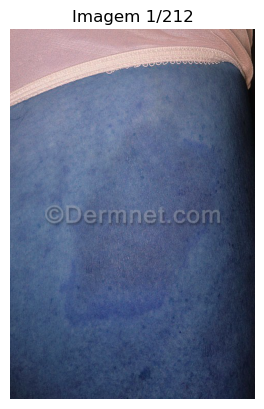

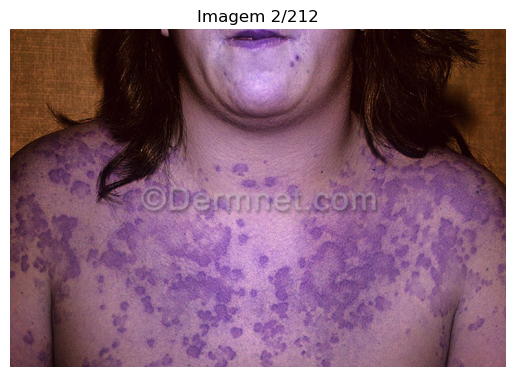

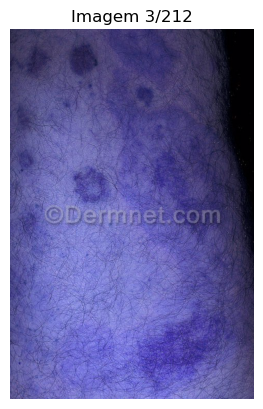

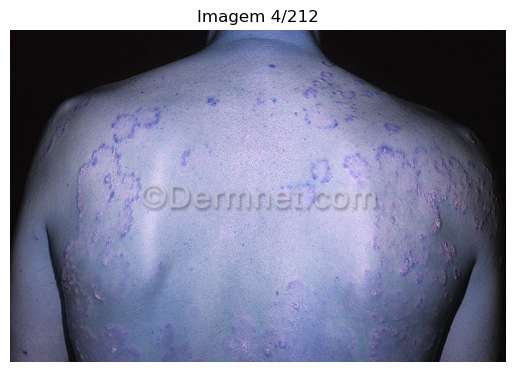

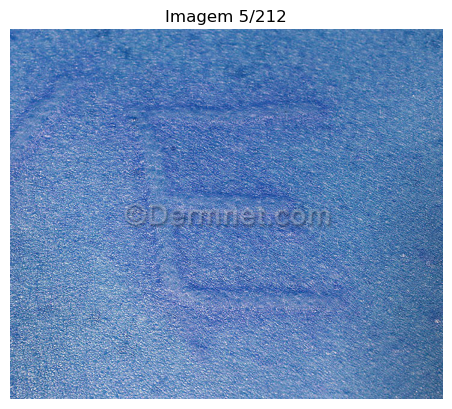

Exibindo imagens da classe: Psoriasis pictures Lichen Planus and related diseases


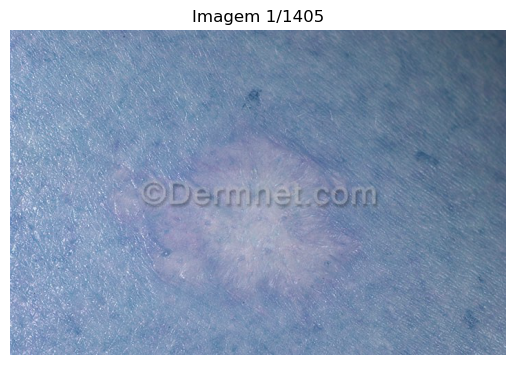

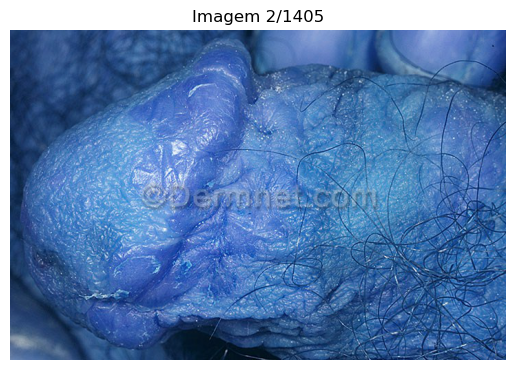

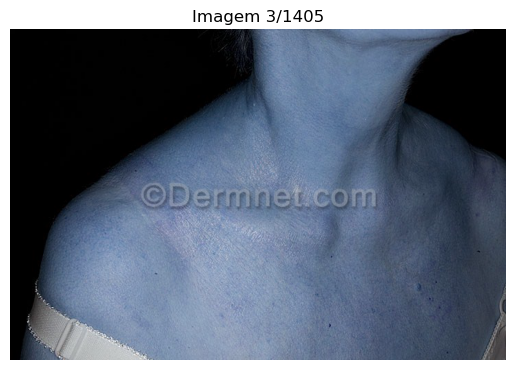

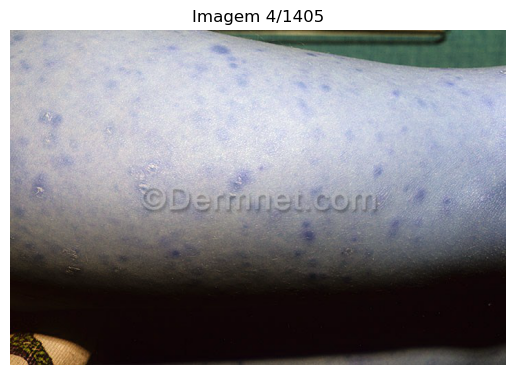

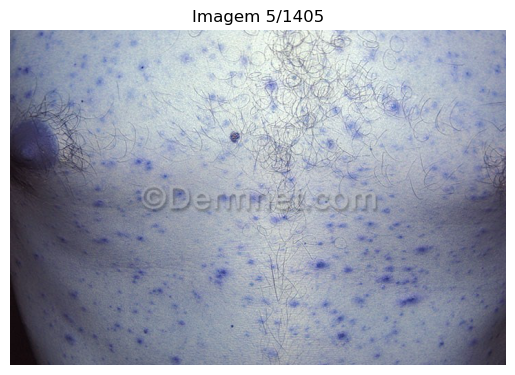

Exibindo imagens da classe: Lupus and other Connective Tissue diseases


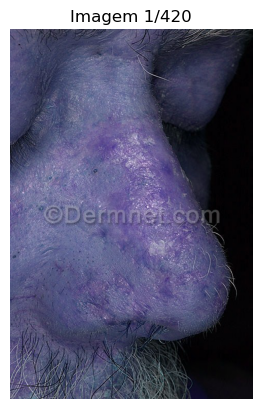

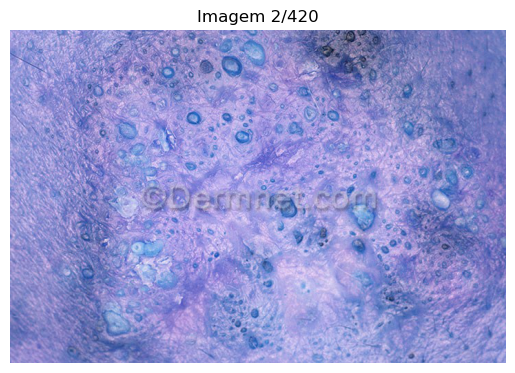

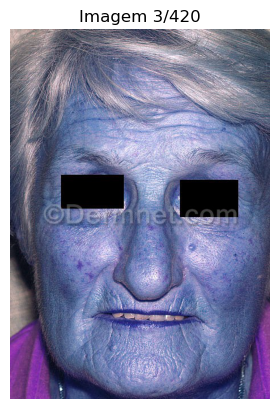

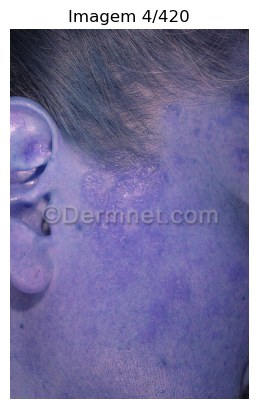

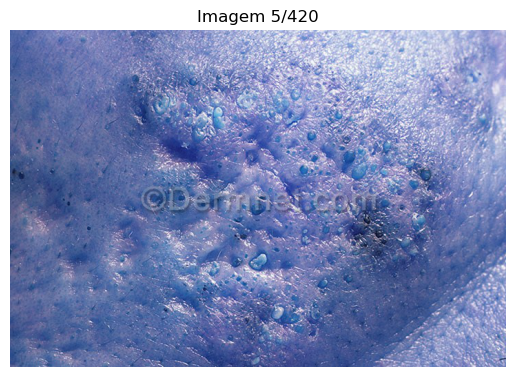

Exibindo imagens da classe: Atopic Dermatitis Photos


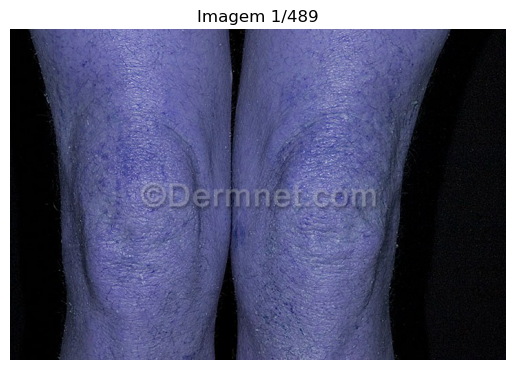

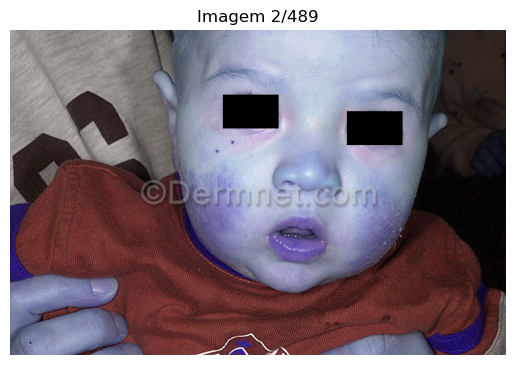

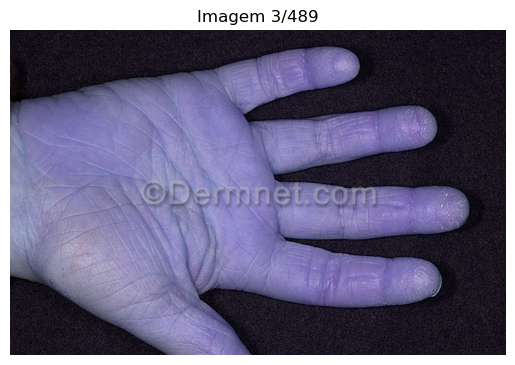

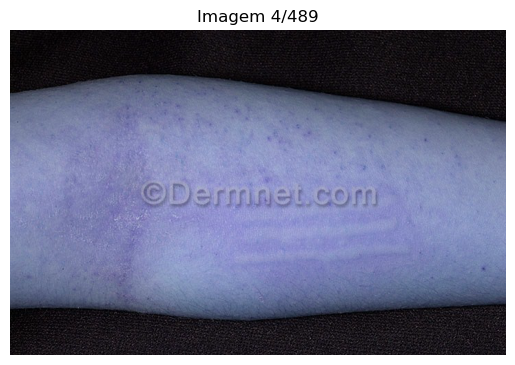

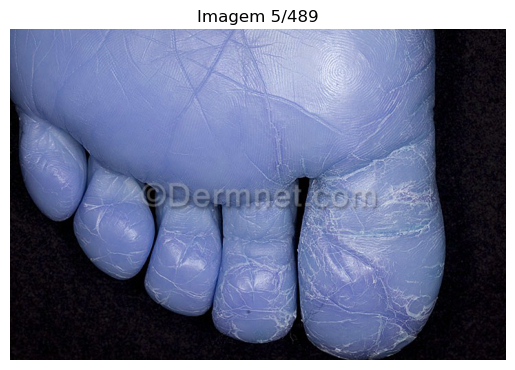

Exibindo imagens da classe: Melanoma Skin Cancer Nevi and Moles


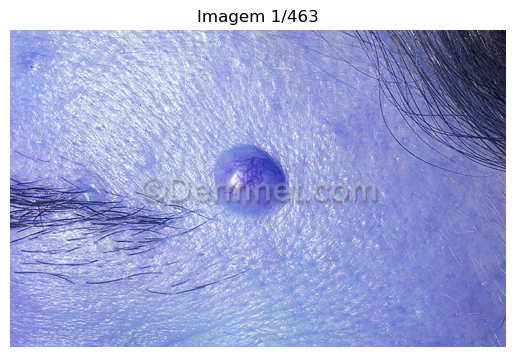

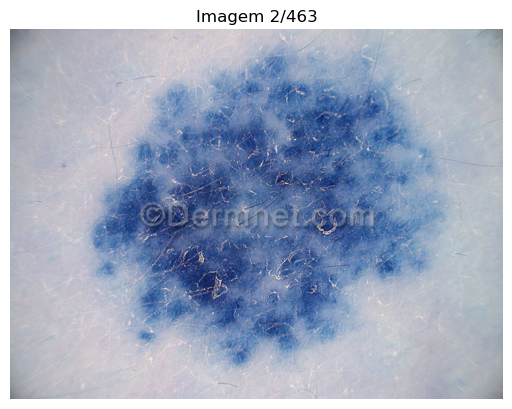

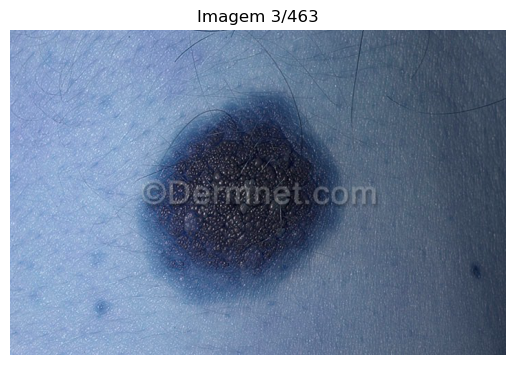

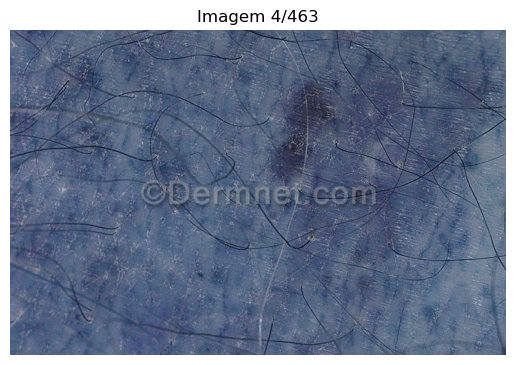

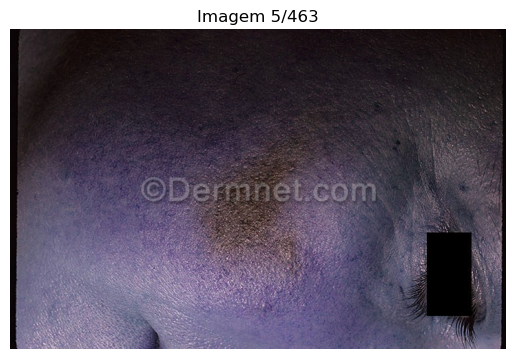

TESTE
Número total de classes: 5
Exibindo imagens da classe: Urticaria Hives


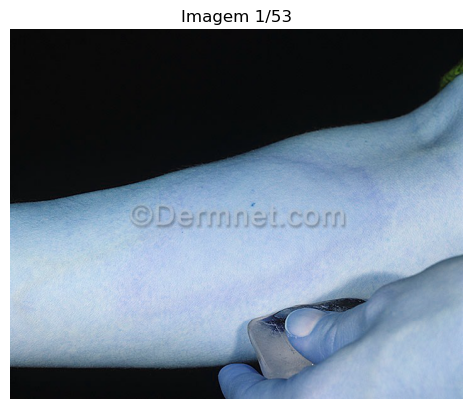

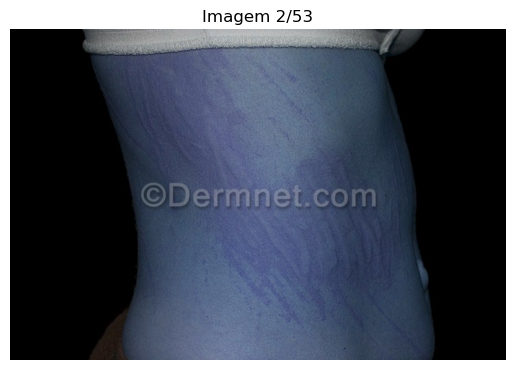

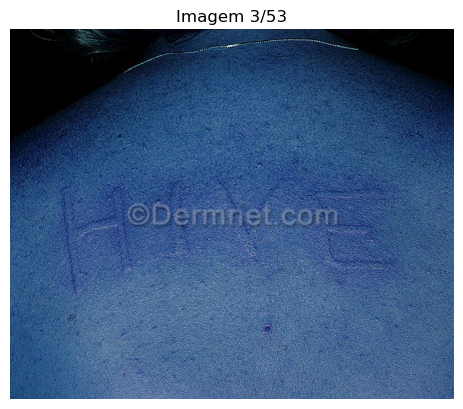

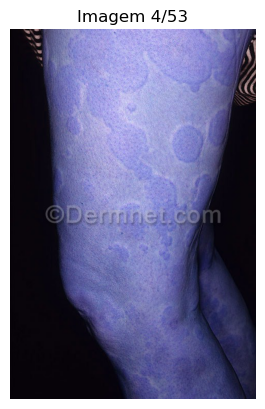

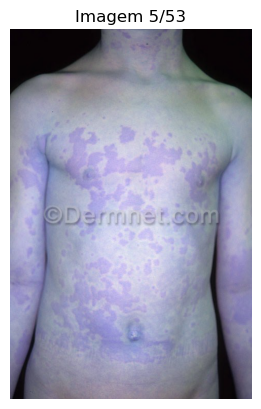

Exibindo imagens da classe: Psoriasis pictures Lichen Planus and related diseases


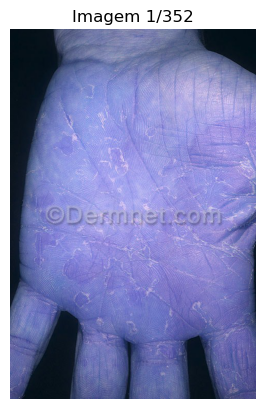

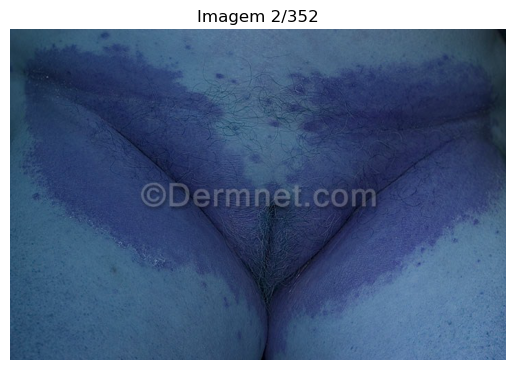

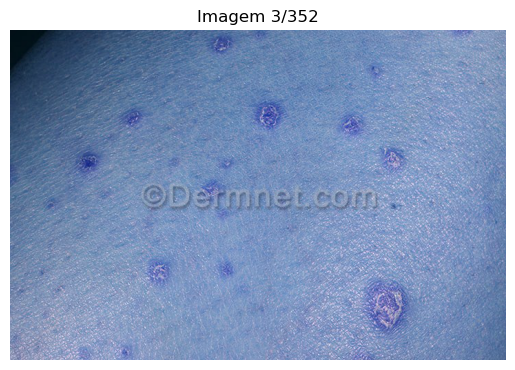

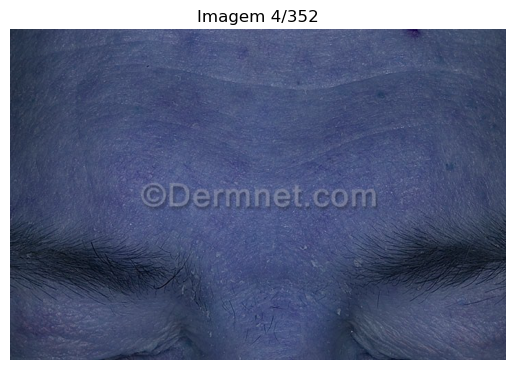

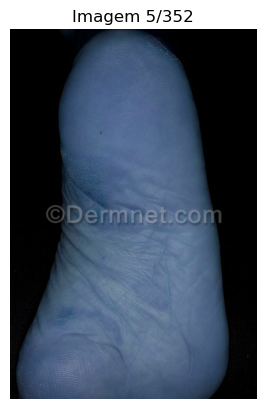

Exibindo imagens da classe: Lupus and other Connective Tissue diseases


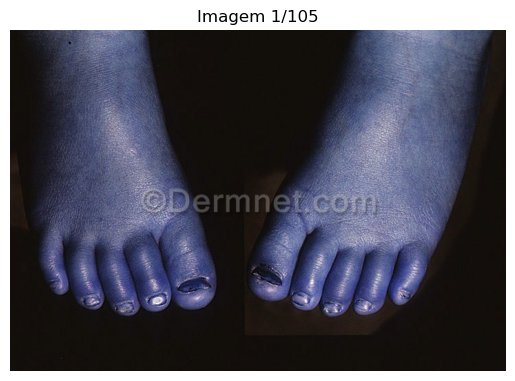

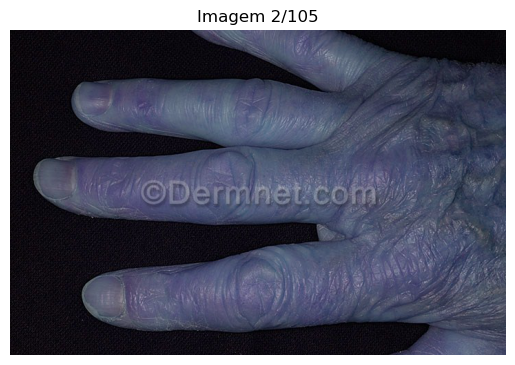

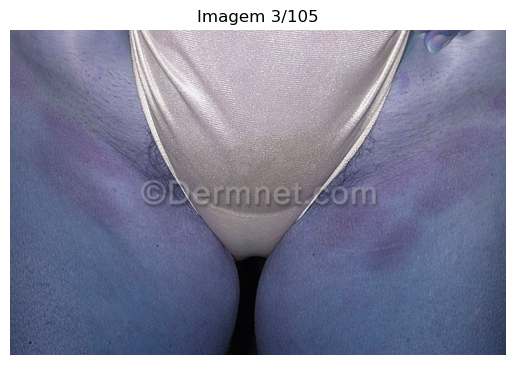

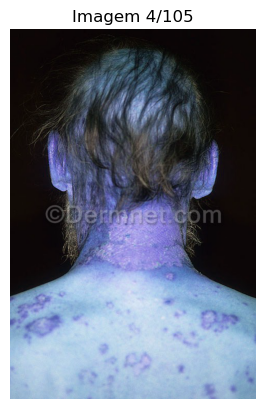

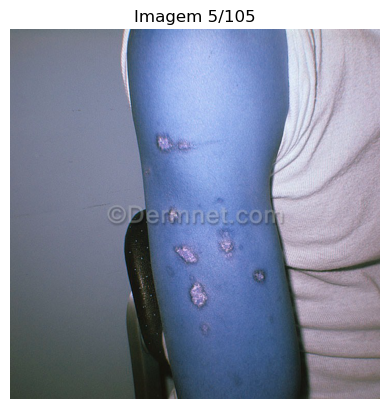

Exibindo imagens da classe: Atopic Dermatitis Photos


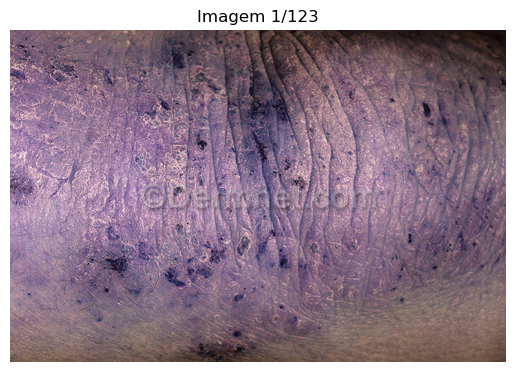

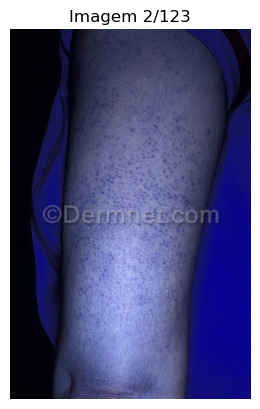

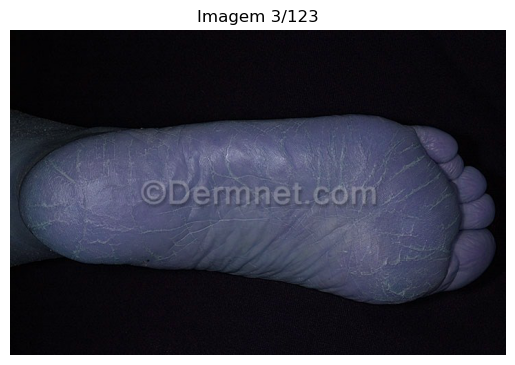

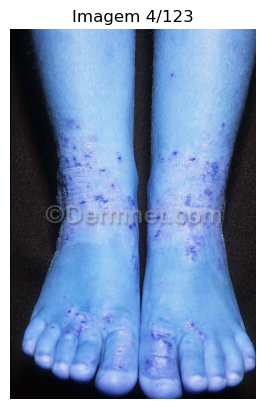

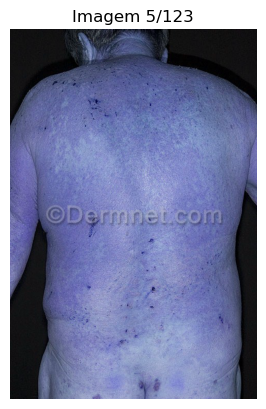

Exibindo imagens da classe: Melanoma Skin Cancer Nevi and Moles


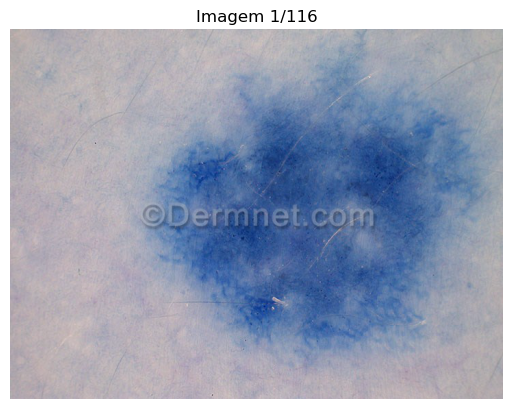

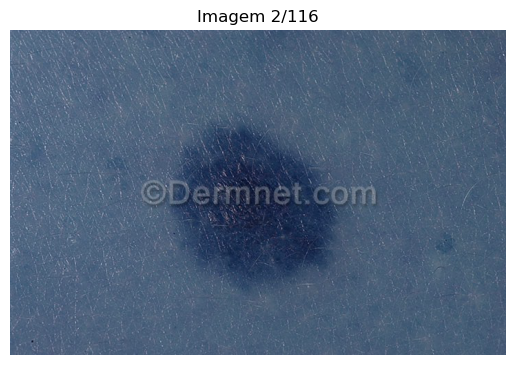

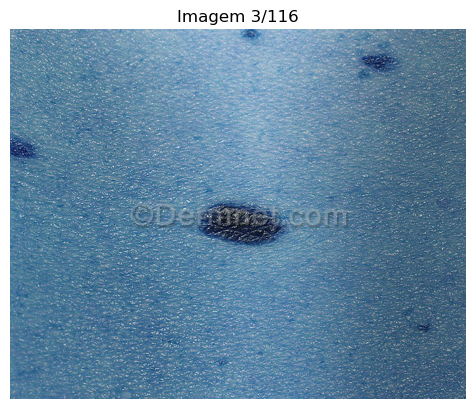

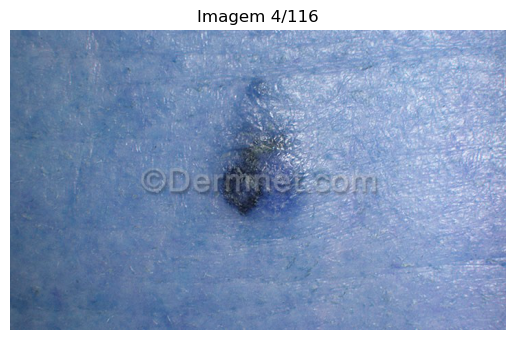

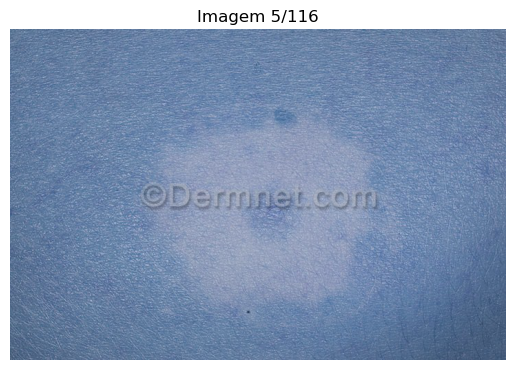

In [4]:
#Função para calcular uma hash para cada imagem
def calculate_hash(img):
    return hashlib.sha256(img).hexdigest()

# Função para carregar imagens de uma dada pasta
def load_images_from_folder(folder):
    hashes=[]
    path=[]
    labels=[]
    filenames=[]
    images_by_class = {}  
    
    # Contar o número de pastas dentro da pasta principal (treino ou teste)
    class_folders = glob.glob(os.path.join(folder, "*"))
    num_classes = len(class_folders)
    
    for class_folder in class_folders:
        class_label = os.path.basename(class_folder)
        print(f"A carregar imagens de {class_label}...")

        images = []
        
        for filename in os.listdir(class_folder):
            try:
                img = cv2.imread(os.path.join(class_folder, filename),cv2.IMREAD_UNCHANGED)
                if img is not None:
                    images.append(img)
                    path.append(filename)
                    hash_imagem=calculate_hash(img)
                    hashes.append(hash_imagem)
                    labels.append(class_label) 
                    filenames.append(os.path.join(class_folder, filename))  
                else:
                    print(f"Não foi possível carregar a imagem: {filename}")
            except Exception as e:
                    print(f"Erro ao carregar a imagem {filename}: {str(e)}")    
        images_by_class[class_label] = images  # Armazenar imagens no dicionário por classe
    return images, hashes, path, labels, filenames, images_by_class


# Carregar imagens de treino e teste
train_images, train_hashes, train_names, train_labels, train_filenames, train_images_by_class  = load_images_from_folder(data_train)
test_images, test_hashes, test_names, test_labels, test_filenames, test_images_by_class  = load_images_from_folder(data_test)

# Verificar se as imagens foram carregadas corretamente
print(f"Número de imagens de treino carregadas: {len(train_images)}")
print(f"Número de imagens de teste carregadas: {len(test_images)}")

# Imprimir o número e nomes dos arquivos por classe nos dados de treino
print("Imagens de treino por classe:")
for class_label in set(train_labels):
    class_filenames = [filename for filename, label in zip(train_filenames, train_labels) if label == class_label]
    print(f"Classe: {class_label}, Número de imagens: {len(class_filenames)}")
    print()

# Imprimir o número e nomes dos arquivos por classe nos dados de teste
print("Imagens de teste por classe:")
for class_label in set(test_labels):
    class_filenames = [filename for filename, label in zip(test_filenames, test_labels) if label == class_label]
    print(f"Classe: {class_label}, Número de imagens: {len(class_filenames)}")
    print()

def display_images(images_by_class, num_images_per_class=5):
    print("Número total de classes:", len(train_images_by_class))
    for class_label, images in images_by_class.items():
        print(f"Exibindo imagens da classe: {class_label}")
        num_images = min(num_images_per_class, len(images))
        for i in range(num_images):
            plt.imshow(images[i])
            plt.title(f"Imagem {i+1}/{len(images)}")
            plt.axis('off')
            plt.show()

# Exibir algumas imagens de treino
print("TREINO")
display_images(train_images_by_class)

print("TESTE")
# Exibir algumas imagens de teste
display_images(test_images_by_class)

# Pré-processamento

# 1.2 Redimensionar Imagens
Para ambos os conjuntos(treino e teste) o tamanho das imagens é ajustado, cortando a imagem caso esta seja maior que o tamanho pretendido(224x224) ou então aumentada atraves de uma borda.

In [5]:
# Redimensionar imagens
def resize_images(images, new_size):
    resized_images = {}
    for class_label, class_images in images.items():
        resized_images[class_label] = []
        for img in class_images:
            resized_img = cv2.resize(img, new_size)
            resized_images[class_label].append(resized_img)
    return resized_images

# Tamanho desejado para as imagens (250x250)
new_size = (250, 250)

# Redimensionar imagens de treino e teste
train_images_resized = resize_images(train_images_by_class, new_size)
test_images_resized = resize_images(test_images_by_class, new_size)

# Verificar se as imagens foram redimensionadas corretamente
print("Treino")
for class_label, resized_images in train_images_resized.items():
    print(f"Número de imagens de treino redimensionadas para a classe {class_label}: {len(resized_images)}")

print("Teste")
for class_label, resized_images in test_images_resized.items():
    print(f"Número de imagens de teste redimensionadas para a classe {class_label}: {len(resized_images)}")

Treino
Número de imagens de treino redimensionadas para a classe Urticaria Hives: 212
Número de imagens de treino redimensionadas para a classe Psoriasis pictures Lichen Planus and related diseases: 1405
Número de imagens de treino redimensionadas para a classe Lupus and other Connective Tissue diseases: 420
Número de imagens de treino redimensionadas para a classe Atopic Dermatitis Photos: 489
Número de imagens de treino redimensionadas para a classe Melanoma Skin Cancer Nevi and Moles: 463
Teste
Número de imagens de teste redimensionadas para a classe Urticaria Hives: 53
Número de imagens de teste redimensionadas para a classe Psoriasis pictures Lichen Planus and related diseases: 352
Número de imagens de teste redimensionadas para a classe Lupus and other Connective Tissue diseases: 105
Número de imagens de teste redimensionadas para a classe Atopic Dermatitis Photos: 123
Número de imagens de teste redimensionadas para a classe Melanoma Skin Cancer Nevi and Moles: 116


## 1.8 Normalização e Balanceamento dos dados

Para balancear as classes existentes implementamos o Random Over Sampler, este aumenta artificialmente o número de exemplos nas classes minoritárias.

In [6]:
def normalize_images(images):
    normalized_images_dict = {}
    for class_label, class_images in images.items():
        normalized_images = []
        for img in class_images:
            normalized_img = img / 255.0  # Normalizar os valores dos pixels para o intervalo [0, 1]
            normalized_images.append(normalized_img)
        normalized_images_dict[class_label] = np.array(normalized_images)
    return normalized_images_dict

# Normalizar imagens de treinamento e teste
train_images_normalized = normalize_images(train_images_resized)
for class_label, normalized_images in train_images_normalized.items():
    print(f"Número de imagens de treino normalizadas para a classe {class_label}: {normalized_images.shape}")

test_images_normalized = normalize_images(test_images_resized)
for class_label, normalized_images in test_images_normalized.items():
    print(f"Número de imagens de teste normalizadas para a classe {class_label}: {normalized_images.shape}")

Número de imagens de treino normalizadas para a classe Urticaria Hives: (212, 250, 250, 3)
Número de imagens de treino normalizadas para a classe Psoriasis pictures Lichen Planus and related diseases: (1405, 250, 250, 3)
Número de imagens de treino normalizadas para a classe Lupus and other Connective Tissue diseases: (420, 250, 250, 3)
Número de imagens de treino normalizadas para a classe Atopic Dermatitis Photos: (489, 250, 250, 3)
Número de imagens de treino normalizadas para a classe Melanoma Skin Cancer Nevi and Moles: (463, 250, 250, 3)
Número de imagens de teste normalizadas para a classe Urticaria Hives: (53, 250, 250, 3)
Número de imagens de teste normalizadas para a classe Psoriasis pictures Lichen Planus and related diseases: (352, 250, 250, 3)
Número de imagens de teste normalizadas para a classe Lupus and other Connective Tissue diseases: (105, 250, 250, 3)
Número de imagens de teste normalizadas para a classe Atopic Dermatitis Photos: (123, 250, 250, 3)
Número de imagens

In [7]:
del train_images, train_hashes, train_names, train_labels, train_filenames, train_images_by_class
del test_images, test_hashes, test_names, test_labels, test_filenames, test_images_by_class
del load_images_from_folder
del calculate_hash

del train_images_resized
del resize_images

del normalize_images
print("Otimização de memoria concluida")

Otimização de memoria concluida


Contagem de amostras antes do balanceamento: {'Urticaria Hives': 212, 'Psoriasis pictures Lichen Planus and related diseases': 1405, 'Lupus and other Connective Tissue diseases': 420, 'Atopic Dermatitis Photos': 489, 'Melanoma Skin Cancer Nevi and Moles': 463}


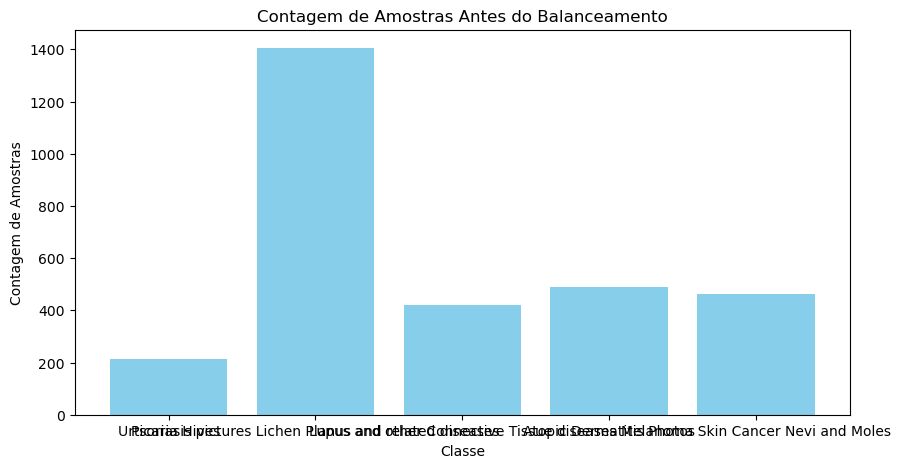

Shape original de X: (2989, 250, 250, 3)
Shape original de Y: (2989,)
Shape dos dados balanceados de X: (7025, 187500)
Shape dos dados balanceados de Y: (7025,)


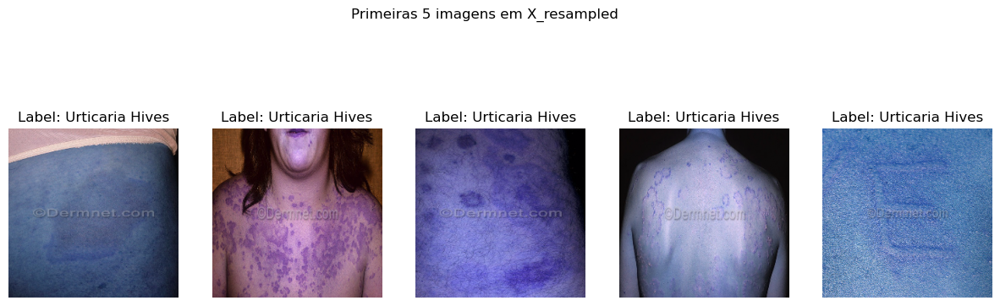

In [8]:

def plot_sample_counts(data_dict, title):
    labels = list(data_dict.keys())
    counts = list(data_dict.values())
    
    plt.figure(figsize=(10, 5))
    plt.bar(labels, counts, color='skyblue')
    plt.xlabel('Classe')
    plt.ylabel('Contagem de Amostras')
    plt.title(title)
    plt.show()

# Função para calcular a contagem de amostras por classe
def count_samples_by_class(data_dict):
    counts = {label: len(samples) for label, samples in data_dict.items()}
    return counts

# Contagem de amostras antes do balanceamento
before_balancing = count_samples_by_class(train_images_normalized)
print("Contagem de amostras antes do balanceamento:", before_balancing)
plot_sample_counts(before_balancing, 'Contagem de Amostras Antes do Balanceamento')

# Separar as chaves (y) e os valores correspondentes (X)
X = []
Y = []

for y, x in train_images_normalized.items():
    X.extend(x)
    Y.extend([y] * len(x))  # Replicando o rótulo 'y' para cada imagem 'x'

# Converter para numpy arrays
X = np.array(X)
Y = np.array(Y)

# Shape original dos dados
print("Shape original de X:", X.shape)
print("Shape original de Y:", Y.shape)

#Realizar oversampling apenas nas classes minoritárias após a normalização
oversampler = RandomOverSampler(random_state=42)
X_resampled, Y_resampled = oversampler.fit_resample(X.reshape(-1, np.prod(X.shape[1:])), Y)

# Shape dos dados balanceados
print("Shape dos dados balanceados de X:", X_resampled.shape)
print("Shape dos dados balanceados de Y:", Y_resampled.shape)

# Visualizar as primeiras 5 imagens em X_resampled
plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(X_resampled[i].reshape(250, 250, 3))
    plt.title(f'Label: {Y_resampled[i]}')
    plt.axis('off')
plt.suptitle('Primeiras 5 imagens em X_resampled')
plt.show()

# Contagem de amostras após o balanceamento

#after_balancing = count_samples_by_class(X_resampled)
#print("\nContagem de amostras após o balanceamento:", after_balancing)
#plot_sample_counts(after_balancing, 'Contagem de Amostras Após o Balanceamento')

Label: Urticaria Hives, Número de imagens: 1405
Label: Psoriasis pictures Lichen Planus and related diseases, Número de imagens: 1405
Label: Lupus and other Connective Tissue diseases, Número de imagens: 1405
Label: Atopic Dermatitis Photos, Número de imagens: 1405
Label: Melanoma Skin Cancer Nevi and Moles, Número de imagens: 1405


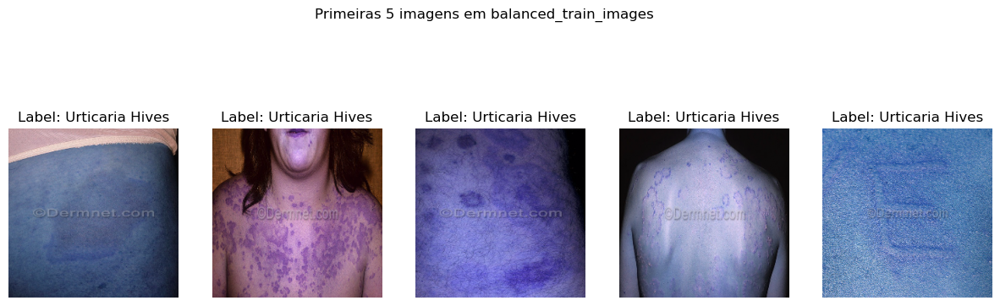

In [9]:
balanced_train_images={}
for i, y in enumerate(Y_resampled):
    x = X_resampled[i].reshape((250, 250, 3))
    if y not in balanced_train_images:
        balanced_train_images[y] = []
    balanced_train_images[y].append(x)

for label, images in balanced_train_images.items():
    print(f"Label: {label}, Número de imagens: {(len(images))}")

# Visualizar as primeiras 5 imagens em balanced_train_images
plt.figure(figsize=(15, 5))
for label, images in balanced_train_images.items():
    for i in range(min(5, len(images))):
        plt.subplot(1, 5, i+1)
        plt.imshow(images[i])
        plt.title(f'Label: {label}')
        plt.axis('off')
    break  # Mostrar apenas as imagens da primeira classe
plt.suptitle('Primeiras 5 imagens em balanced_train_images')
plt.show()

# Guardar os novos dados
Após o pre-processamento estar concluido guardar a nova instancia dos dados para posteriormente utiliza-los para treinar diferentes modelos

In [ ]:
# Função para salvar as imagens em pastas
def save_images_to_folders(data, output_dir):
    # Iterar sobre as chaves e valores do dicionário
    for label, images in data.items():
        # Criar o diretório se não existir
        label_dir = os.path.join(output_dir, str(label))
        os.makedirs(label_dir, exist_ok=True)
        
        # Salvar cada imagem no diretório correspondente
        for i, img in enumerate(images):
            img_path = os.path.join(label_dir, f"image_{i}.jpg")
            #cv2.imwrite(img_path, img) #work for treino 
            min_val,max_val=img.min(),img.max()
            img = 255.0*(img - min_val)/(max_val - min_val)
            img = img.astype(np.uint8)
            cv2.imwrite(img_path, img)


# Criar a pasta se ela não existir
folder_train = 'DataProcessed/train'
folder_test = 'DataProcessed/test'
save_images_to_folders(balanced_train_images, folder_train)
print("Images de treino guardadas com sucesso")
save_images_to_folders(test_images_resized, folder_test)
print("Images de teste guardadas com sucesso")